<a href="https://colab.research.google.com/github/HoangNguyennnnnnn/ComputerVision/blob/main/MeanFlow_CIFAR10_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🧪 Debug: Flow Matching Baseline First

**Problem:** MeanFlow loss stays high (~20-100), samples are noise.

**Strategy:** Test standard Flow Matching FIRST to verify model works,
then gradually add MeanFlow components.

## Step 1: Standard Flow Matching
- Train model to predict velocity v = ε - x
- This is simpler and should work
- Loss should drop to ~0.1-0.5

## Step 2: If Step 1 works → Add MeanFlow

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import AdamW
from torchvision import transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import DataLoader, Subset
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import math, os
import numpy as np

torch.manual_seed(42)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

Device: cuda


In [ ]:
# Dataset
def get_dl(bs=128):
    tf = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    ds = CIFAR10("./data", train=True, download=True, transform=tf)
    idx = [i for i, (_, l) in enumerate(ds) if l == 1]  # Automobiles
    return DataLoader(Subset(ds, idx), batch_size=bs, shuffle=True, num_workers=2, drop_last=True)

dl = get_dl(128)
print(f"Dataset: {len(dl.dataset)} images")

100%|██████████| 170M/170M [00:14<00:00, 12.1MB/s]


Dataset: 5000 images


In [ ]:
# Simple U-Net (VERY simple for debugging)
class SinEmbed(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim
    def forward(self, t):
        half = self.dim // 2
        f = torch.exp(-math.log(10000) * torch.arange(half, device=t.device) / half)
        e = t[:, None] * f * 1000
        return torch.cat([e.sin(), e.cos()], -1)

class Block(nn.Module):
    def __init__(self, ci, co, td):
        super().__init__()
        self.net = nn.Sequential(
            nn.GroupNorm(8, ci),
            nn.SiLU(),
            nn.Conv2d(ci, co, 3, padding=1),
            nn.GroupNorm(8, co),
            nn.SiLU(),
            nn.Conv2d(co, co, 3, padding=1)
        )
        self.tp = nn.Linear(td, co)
        self.sk = nn.Conv2d(ci, co, 1) if ci != co else nn.Identity()
    def forward(self, x, t):
        h = self.net(x) + self.tp(t)[:, :, None, None]
        return h + self.sk(x)

class SimpleUNet(nn.Module):
    """Very simple U-Net for debugging - only takes (z, t)"""
    def __init__(self, ch=64, td=128):
        super().__init__()
        self.te = nn.Sequential(SinEmbed(td//2), nn.Linear(td//2, td), nn.SiLU(), nn.Linear(td, td))

        self.cin = nn.Conv2d(3, ch, 3, padding=1)
        self.e1 = Block(ch, ch, td)
        self.d1 = nn.Conv2d(ch, ch, 3, stride=2, padding=1)  # 32->16
        self.e2 = Block(ch, ch*2, td)
        self.d2 = nn.Conv2d(ch*2, ch*2, 3, stride=2, padding=1)  # 16->8

        self.mid = Block(ch*2, ch*2, td)

        self.u2 = nn.Upsample(scale_factor=2, mode='nearest')
        self.du2 = Block(ch*4, ch, td)  # 8->16, concat with skip
        self.u1 = nn.Upsample(scale_factor=2, mode='nearest')
        self.du1 = Block(ch*2, ch, td)  # 16->32, concat with skip

        self.cout = nn.Sequential(nn.GroupNorm(8, ch), nn.SiLU(), nn.Conv2d(ch, 3, 3, padding=1))
        nn.init.zeros_(self.cout[-1].weight)
        nn.init.zeros_(self.cout[-1].bias)

    def forward(self, z, t):
        """Simple forward: only z and t (no r for now)"""
        emb = self.te(t)

        h = self.cin(z)
        h1 = self.e1(h, emb)  # 32x32
        h = self.d1(h1)  # 16x16
        h2 = self.e2(h, emb)
        h = self.d2(h2)  # 8x8

        h = self.mid(h, emb)  # 8x8

        h = self.u2(h)  # 16x16
        h = torch.cat([h, h2], 1)
        h = self.du2(h, emb)
        h = self.u1(h)  # 32x32
        h = torch.cat([h, h1], 1)
        h = self.du1(h, emb)

        return self.cout(h)

model = SimpleUNet(ch=64).to(device)
print(f"Model: {sum(p.numel() for p in model.parameters()):,} params")

Model: 1,191,619 params


## Standard Flow Matching Loss

Simple version: predict velocity v = ε - x

In [ ]:
def flow_matching_loss(model, x, device):
    """
    Standard Flow Matching loss.

    z_t = (1-t)*x + t*ε
    v_t = ε - x  (target velocity)

    Loss = MSE(model(z_t, t), v_t)
    """
    B = x.shape[0]

    # Sample time uniformly
    t = torch.rand(B, device=device)

    # Sample noise
    eps = torch.randn_like(x)

    # Interpolate
    t_exp = t[:, None, None, None]
    z_t = (1 - t_exp) * x + t_exp * eps

    # Target velocity (constant for linear path!)
    v_target = eps - x

    # Predict
    v_pred = model(z_t, t)

    # MSE loss
    return F.mse_loss(v_pred, v_target)

@torch.no_grad()
def sample_euler(model, n, device, steps=50):
    """Multi-step Euler sampling for Flow Matching"""
    z = torch.randn(n, 3, 32, 32, device=device)
    dt = 1.0 / steps

    for i in range(steps):
        t = torch.ones(n, device=device) * (1 - i * dt)
        v = model(z, t)
        z = z - v * dt  # Move backward from noise to data

    return ((z).clamp(-1, 1) + 1) / 2

# Test
x = torch.randn(4, 3, 32, 32, device=device)
loss = flow_matching_loss(model, x, device)
print(f"Test loss: {loss.item():.4f}")
print("Expected initial loss: ~2.0 (MSE of random predictions)")

Test loss: 1.9614
Expected initial loss: ~2.0 (MSE of random predictions)


In [ ]:
# Training
os.makedirs("results", exist_ok=True)
torch.cuda.empty_cache()

model = SimpleUNet(ch=64).to(device)
optimizer = AdamW(model.parameters(), lr=1e-4)

epochs = 500  # Quick test
loss_history = []

print(f"Training Flow Matching baseline for {epochs} epochs...")

Training Flow Matching baseline for 500 epochs...


E1:   0%|          | 0/39 [00:00<?, ?it/s]

E  1 | Loss: 1.1508


E2:   0%|          | 0/39 [00:00<?, ?it/s]

E3:   0%|          | 0/39 [00:00<?, ?it/s]

E4:   0%|          | 0/39 [00:00<?, ?it/s]

E5:   0%|          | 0/39 [00:00<?, ?it/s]

E6:   0%|          | 0/39 [00:00<?, ?it/s]

E7:   0%|          | 0/39 [00:00<?, ?it/s]

E8:   0%|          | 0/39 [00:00<?, ?it/s]

E9:   0%|          | 0/39 [00:00<?, ?it/s]

E10:   0%|          | 0/39 [00:00<?, ?it/s]

E 10 | Loss: 0.3147


E11:   0%|          | 0/39 [00:00<?, ?it/s]

E12:   0%|          | 0/39 [00:00<?, ?it/s]

E13:   0%|          | 0/39 [00:00<?, ?it/s]

E14:   0%|          | 0/39 [00:00<?, ?it/s]

E15:   0%|          | 0/39 [00:00<?, ?it/s]

E16:   0%|          | 0/39 [00:00<?, ?it/s]

E17:   0%|          | 0/39 [00:00<?, ?it/s]

E18:   0%|          | 0/39 [00:00<?, ?it/s]

E19:   0%|          | 0/39 [00:00<?, ?it/s]

E20:   0%|          | 0/39 [00:00<?, ?it/s]

E 20 | Loss: 0.2735


E21:   0%|          | 0/39 [00:00<?, ?it/s]

E22:   0%|          | 0/39 [00:00<?, ?it/s]

E23:   0%|          | 0/39 [00:00<?, ?it/s]

E24:   0%|          | 0/39 [00:00<?, ?it/s]

E25:   0%|          | 0/39 [00:00<?, ?it/s]

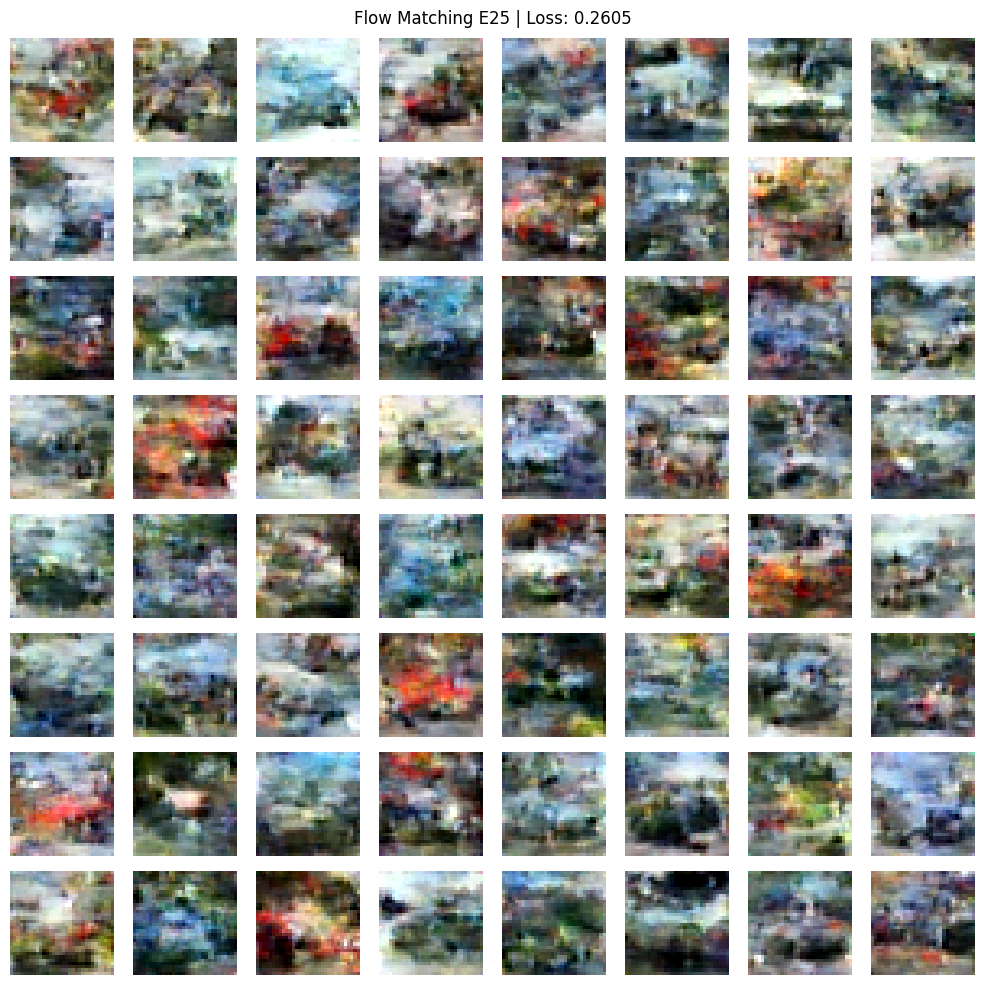

E26:   0%|          | 0/39 [00:00<?, ?it/s]

E27:   0%|          | 0/39 [00:00<?, ?it/s]

E28:   0%|          | 0/39 [00:00<?, ?it/s]

E29:   0%|          | 0/39 [00:00<?, ?it/s]

E30:   0%|          | 0/39 [00:00<?, ?it/s]

E 30 | Loss: 0.2558


E31:   0%|          | 0/39 [00:00<?, ?it/s]

E32:   0%|          | 0/39 [00:00<?, ?it/s]

E33:   0%|          | 0/39 [00:00<?, ?it/s]

E34:   0%|          | 0/39 [00:00<?, ?it/s]

E35:   0%|          | 0/39 [00:00<?, ?it/s]

E36:   0%|          | 0/39 [00:00<?, ?it/s]

E37:   0%|          | 0/39 [00:00<?, ?it/s]

E38:   0%|          | 0/39 [00:00<?, ?it/s]

E39:   0%|          | 0/39 [00:00<?, ?it/s]

E40:   0%|          | 0/39 [00:00<?, ?it/s]

E 40 | Loss: 0.2499


E41:   0%|          | 0/39 [00:00<?, ?it/s]

E42:   0%|          | 0/39 [00:00<?, ?it/s]

E43:   0%|          | 0/39 [00:00<?, ?it/s]

E44:   0%|          | 0/39 [00:00<?, ?it/s]

E45:   0%|          | 0/39 [00:00<?, ?it/s]

E46:   0%|          | 0/39 [00:00<?, ?it/s]

E47:   0%|          | 0/39 [00:00<?, ?it/s]

E48:   0%|          | 0/39 [00:00<?, ?it/s]

E49:   0%|          | 0/39 [00:00<?, ?it/s]

E50:   0%|          | 0/39 [00:00<?, ?it/s]

E 50 | Loss: 0.2428


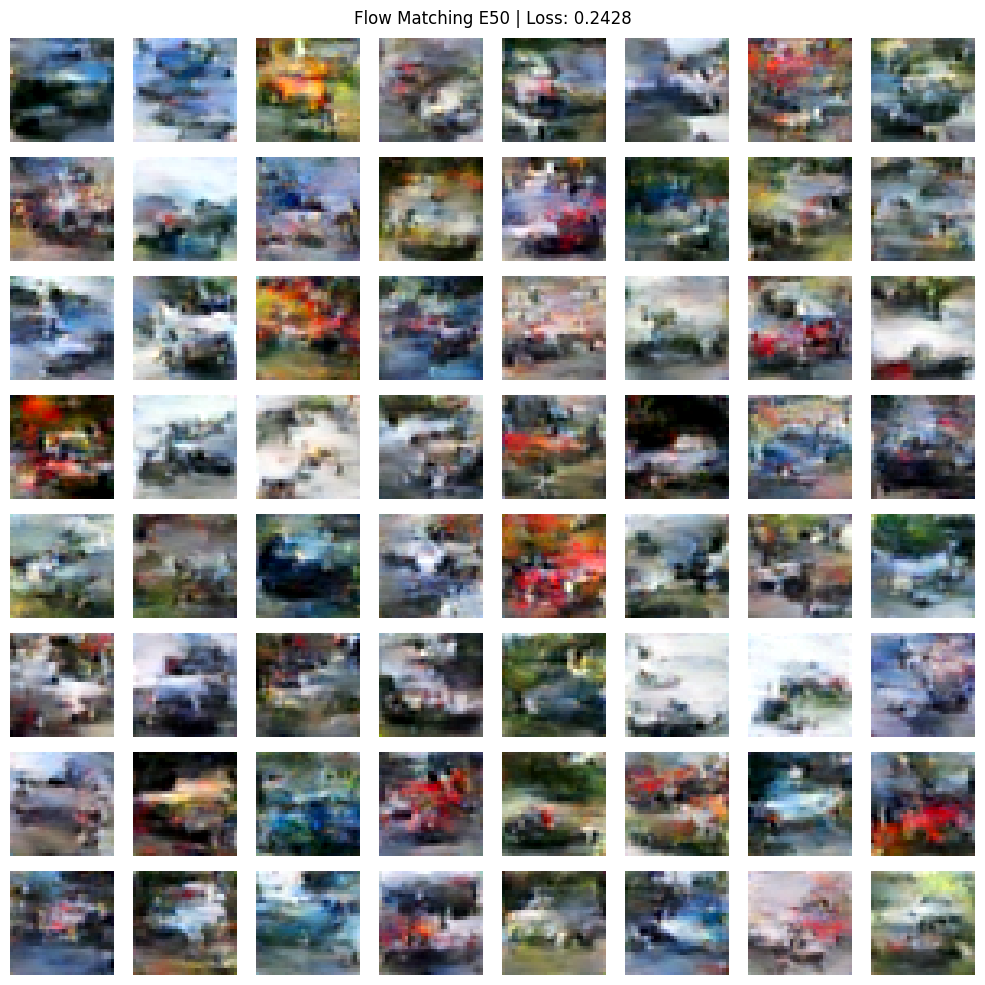

E51:   0%|          | 0/39 [00:00<?, ?it/s]

E52:   0%|          | 0/39 [00:00<?, ?it/s]

E53:   0%|          | 0/39 [00:00<?, ?it/s]

E54:   0%|          | 0/39 [00:00<?, ?it/s]

E55:   0%|          | 0/39 [00:00<?, ?it/s]

E56:   0%|          | 0/39 [00:00<?, ?it/s]

E57:   0%|          | 0/39 [00:00<?, ?it/s]

E58:   0%|          | 0/39 [00:00<?, ?it/s]

E59:   0%|          | 0/39 [00:00<?, ?it/s]

E60:   0%|          | 0/39 [00:00<?, ?it/s]

E 60 | Loss: 0.2397


E61:   0%|          | 0/39 [00:00<?, ?it/s]

E62:   0%|          | 0/39 [00:00<?, ?it/s]

E63:   0%|          | 0/39 [00:00<?, ?it/s]

E64:   0%|          | 0/39 [00:00<?, ?it/s]

E65:   0%|          | 0/39 [00:00<?, ?it/s]

E66:   0%|          | 0/39 [00:00<?, ?it/s]

E67:   0%|          | 0/39 [00:00<?, ?it/s]

E68:   0%|          | 0/39 [00:00<?, ?it/s]

E69:   0%|          | 0/39 [00:00<?, ?it/s]

E70:   0%|          | 0/39 [00:00<?, ?it/s]

E 70 | Loss: 0.2393


E71:   0%|          | 0/39 [00:00<?, ?it/s]

E72:   0%|          | 0/39 [00:00<?, ?it/s]

E73:   0%|          | 0/39 [00:00<?, ?it/s]

E74:   0%|          | 0/39 [00:00<?, ?it/s]

E75:   0%|          | 0/39 [00:00<?, ?it/s]

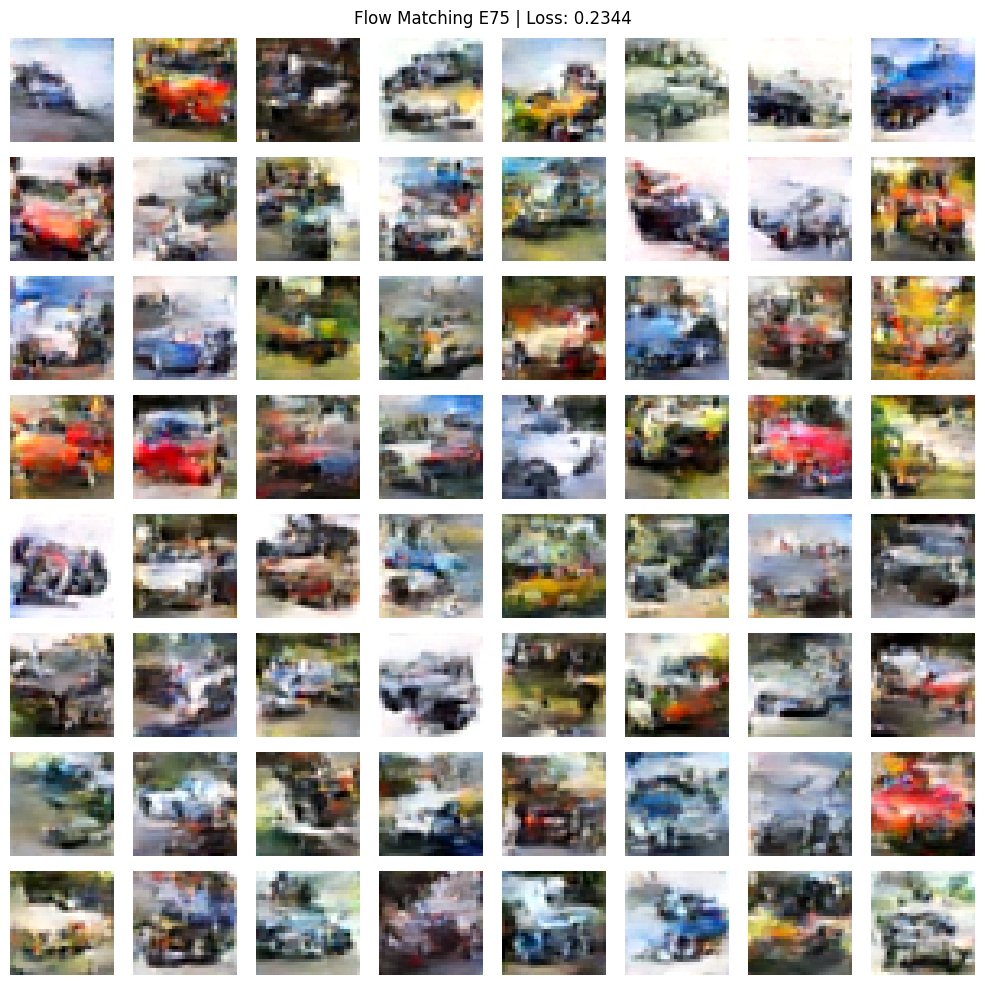

E76:   0%|          | 0/39 [00:00<?, ?it/s]

E77:   0%|          | 0/39 [00:00<?, ?it/s]

E78:   0%|          | 0/39 [00:00<?, ?it/s]

E79:   0%|          | 0/39 [00:00<?, ?it/s]

E80:   0%|          | 0/39 [00:00<?, ?it/s]

E 80 | Loss: 0.2368


E81:   0%|          | 0/39 [00:00<?, ?it/s]

E82:   0%|          | 0/39 [00:00<?, ?it/s]

E83:   0%|          | 0/39 [00:00<?, ?it/s]

E84:   0%|          | 0/39 [00:00<?, ?it/s]

E85:   0%|          | 0/39 [00:00<?, ?it/s]

E86:   0%|          | 0/39 [00:00<?, ?it/s]

E87:   0%|          | 0/39 [00:00<?, ?it/s]

E88:   0%|          | 0/39 [00:00<?, ?it/s]

E89:   0%|          | 0/39 [00:00<?, ?it/s]

E90:   0%|          | 0/39 [00:00<?, ?it/s]

E 90 | Loss: 0.2354


E91:   0%|          | 0/39 [00:00<?, ?it/s]

E92:   0%|          | 0/39 [00:00<?, ?it/s]

E93:   0%|          | 0/39 [00:00<?, ?it/s]

E94:   0%|          | 0/39 [00:00<?, ?it/s]

E95:   0%|          | 0/39 [00:00<?, ?it/s]

E96:   0%|          | 0/39 [00:00<?, ?it/s]

E97:   0%|          | 0/39 [00:00<?, ?it/s]

E98:   0%|          | 0/39 [00:00<?, ?it/s]

E99:   0%|          | 0/39 [00:00<?, ?it/s]

E100:   0%|          | 0/39 [00:00<?, ?it/s]

E100 | Loss: 0.2305


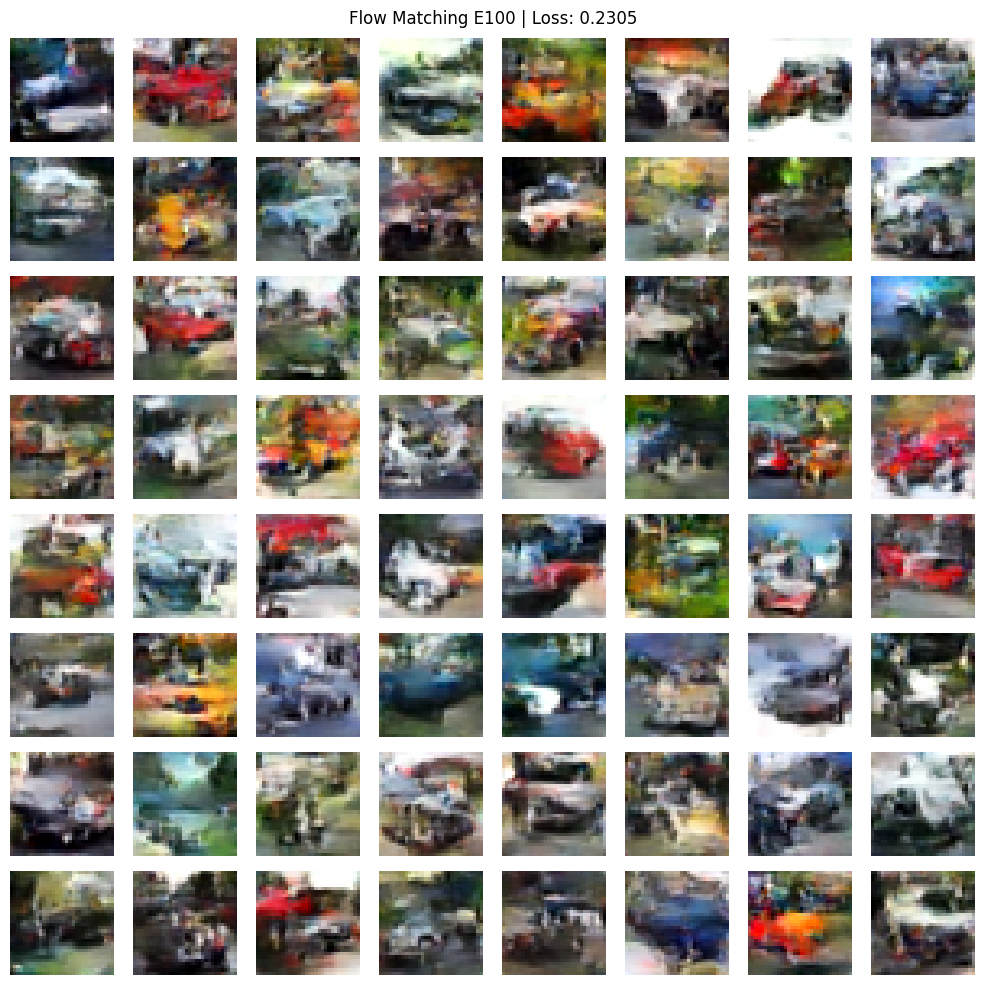

E101:   0%|          | 0/39 [00:00<?, ?it/s]

E102:   0%|          | 0/39 [00:00<?, ?it/s]

E103:   0%|          | 0/39 [00:00<?, ?it/s]

E104:   0%|          | 0/39 [00:00<?, ?it/s]

E105:   0%|          | 0/39 [00:00<?, ?it/s]

E106:   0%|          | 0/39 [00:00<?, ?it/s]

E107:   0%|          | 0/39 [00:00<?, ?it/s]

E108:   0%|          | 0/39 [00:00<?, ?it/s]

E109:   0%|          | 0/39 [00:00<?, ?it/s]

E110:   0%|          | 0/39 [00:00<?, ?it/s]

E110 | Loss: 0.2318


E111:   0%|          | 0/39 [00:00<?, ?it/s]

E112:   0%|          | 0/39 [00:00<?, ?it/s]

E113:   0%|          | 0/39 [00:00<?, ?it/s]

E114:   0%|          | 0/39 [00:00<?, ?it/s]

E115:   0%|          | 0/39 [00:00<?, ?it/s]

E116:   0%|          | 0/39 [00:00<?, ?it/s]

E117:   0%|          | 0/39 [00:00<?, ?it/s]

E118:   0%|          | 0/39 [00:00<?, ?it/s]

E119:   0%|          | 0/39 [00:00<?, ?it/s]

E120:   0%|          | 0/39 [00:00<?, ?it/s]

E120 | Loss: 0.2300


E121:   0%|          | 0/39 [00:00<?, ?it/s]

E122:   0%|          | 0/39 [00:00<?, ?it/s]

E123:   0%|          | 0/39 [00:00<?, ?it/s]

E124:   0%|          | 0/39 [00:00<?, ?it/s]

E125:   0%|          | 0/39 [00:00<?, ?it/s]

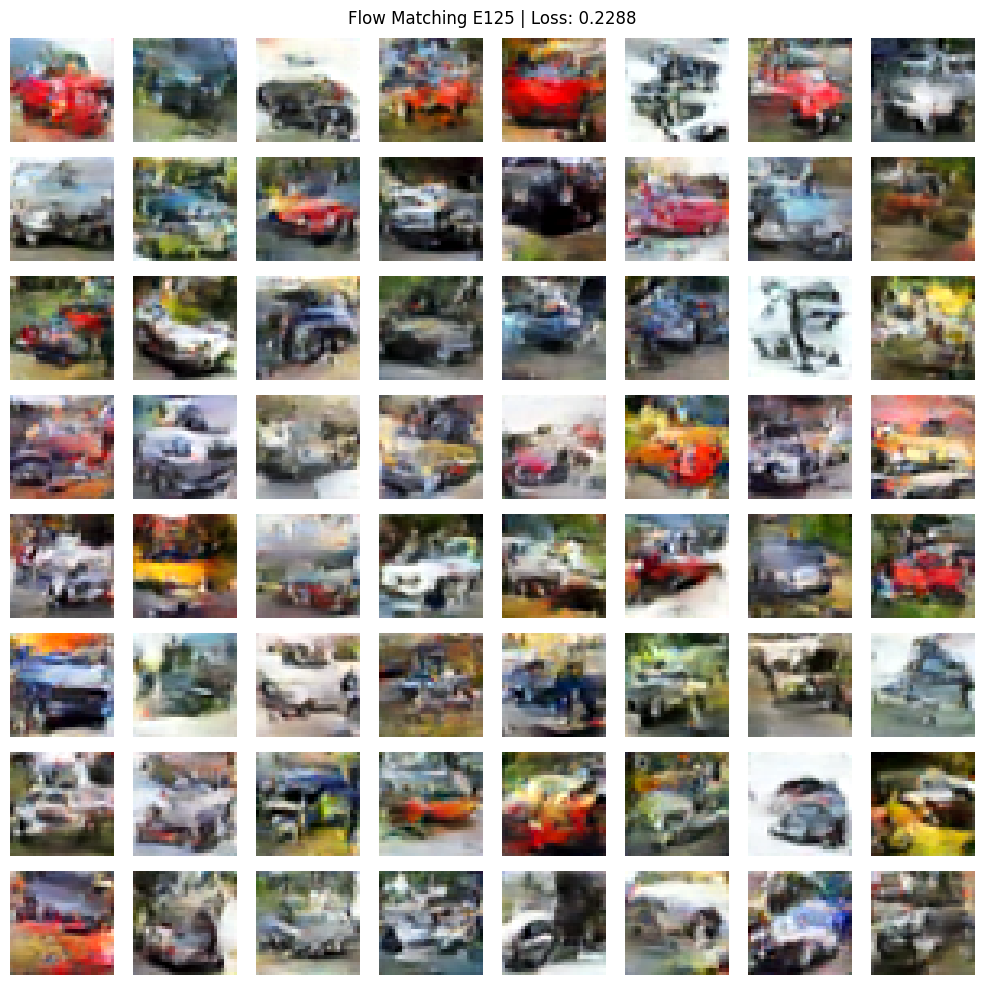

E126:   0%|          | 0/39 [00:00<?, ?it/s]

E127:   0%|          | 0/39 [00:00<?, ?it/s]

E128:   0%|          | 0/39 [00:00<?, ?it/s]

E129:   0%|          | 0/39 [00:00<?, ?it/s]

E130:   0%|          | 0/39 [00:00<?, ?it/s]

E130 | Loss: 0.2244


E131:   0%|          | 0/39 [00:00<?, ?it/s]

E132:   0%|          | 0/39 [00:00<?, ?it/s]

E133:   0%|          | 0/39 [00:00<?, ?it/s]

E134:   0%|          | 0/39 [00:00<?, ?it/s]

E135:   0%|          | 0/39 [00:00<?, ?it/s]

E136:   0%|          | 0/39 [00:00<?, ?it/s]

E137:   0%|          | 0/39 [00:00<?, ?it/s]

E138:   0%|          | 0/39 [00:00<?, ?it/s]

E139:   0%|          | 0/39 [00:00<?, ?it/s]

E140:   0%|          | 0/39 [00:00<?, ?it/s]

E140 | Loss: 0.2284


E141:   0%|          | 0/39 [00:00<?, ?it/s]

E142:   0%|          | 0/39 [00:00<?, ?it/s]

E143:   0%|          | 0/39 [00:00<?, ?it/s]

E144:   0%|          | 0/39 [00:00<?, ?it/s]

E145:   0%|          | 0/39 [00:00<?, ?it/s]

E146:   0%|          | 0/39 [00:00<?, ?it/s]

E147:   0%|          | 0/39 [00:00<?, ?it/s]

E148:   0%|          | 0/39 [00:00<?, ?it/s]

E149:   0%|          | 0/39 [00:00<?, ?it/s]

E150:   0%|          | 0/39 [00:00<?, ?it/s]

E150 | Loss: 0.2254


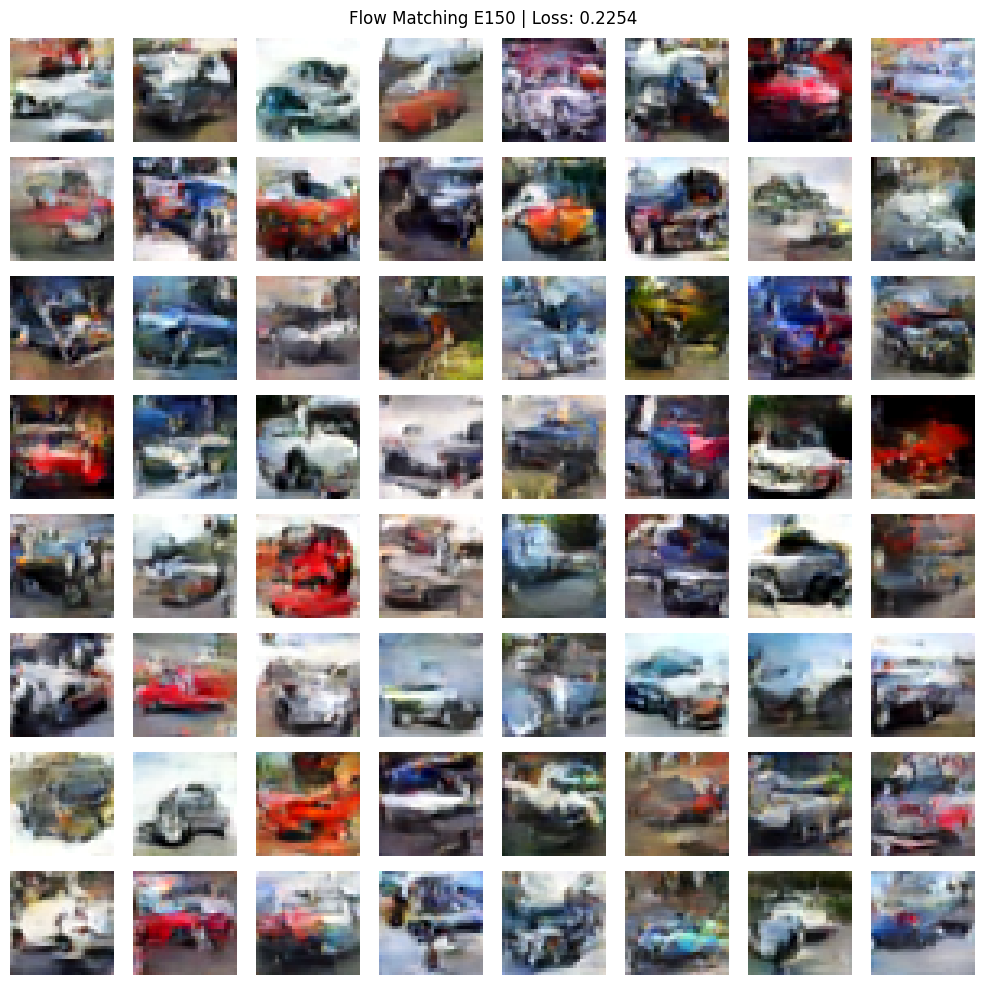

E151:   0%|          | 0/39 [00:00<?, ?it/s]

E152:   0%|          | 0/39 [00:00<?, ?it/s]

E153:   0%|          | 0/39 [00:00<?, ?it/s]

E154:   0%|          | 0/39 [00:00<?, ?it/s]

E155:   0%|          | 0/39 [00:00<?, ?it/s]

E156:   0%|          | 0/39 [00:00<?, ?it/s]

E157:   0%|          | 0/39 [00:00<?, ?it/s]

E158:   0%|          | 0/39 [00:00<?, ?it/s]

E159:   0%|          | 0/39 [00:00<?, ?it/s]

E160:   0%|          | 0/39 [00:00<?, ?it/s]

E160 | Loss: 0.2238


E161:   0%|          | 0/39 [00:00<?, ?it/s]

E162:   0%|          | 0/39 [00:00<?, ?it/s]

E163:   0%|          | 0/39 [00:00<?, ?it/s]

E164:   0%|          | 0/39 [00:00<?, ?it/s]

E165:   0%|          | 0/39 [00:00<?, ?it/s]

E166:   0%|          | 0/39 [00:00<?, ?it/s]

E167:   0%|          | 0/39 [00:00<?, ?it/s]

E168:   0%|          | 0/39 [00:00<?, ?it/s]

E169:   0%|          | 0/39 [00:00<?, ?it/s]

E170:   0%|          | 0/39 [00:00<?, ?it/s]

E170 | Loss: 0.2248


E171:   0%|          | 0/39 [00:00<?, ?it/s]

E172:   0%|          | 0/39 [00:00<?, ?it/s]

E173:   0%|          | 0/39 [00:00<?, ?it/s]

E174:   0%|          | 0/39 [00:00<?, ?it/s]

E175:   0%|          | 0/39 [00:00<?, ?it/s]

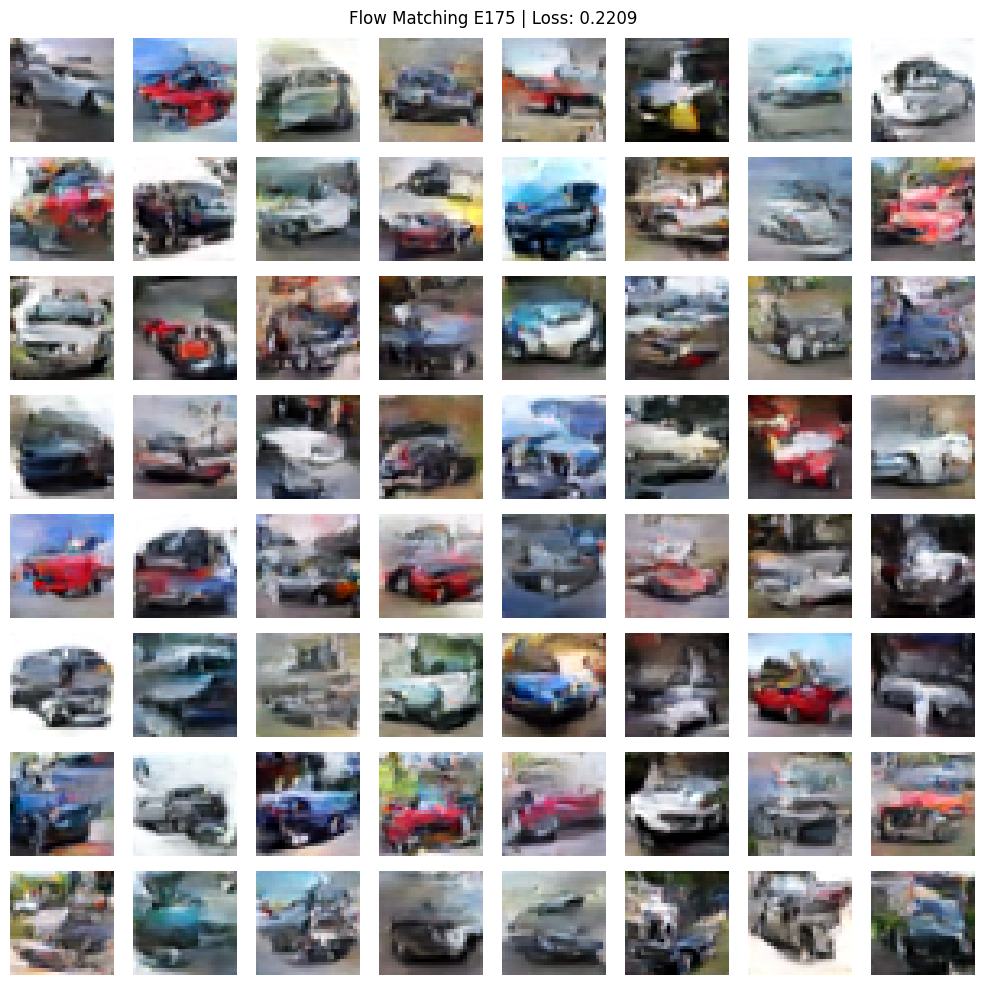

E176:   0%|          | 0/39 [00:00<?, ?it/s]

E177:   0%|          | 0/39 [00:00<?, ?it/s]

E178:   0%|          | 0/39 [00:00<?, ?it/s]

E179:   0%|          | 0/39 [00:00<?, ?it/s]

E180:   0%|          | 0/39 [00:00<?, ?it/s]

E180 | Loss: 0.2251


E181:   0%|          | 0/39 [00:00<?, ?it/s]

E182:   0%|          | 0/39 [00:00<?, ?it/s]

E183:   0%|          | 0/39 [00:00<?, ?it/s]

E184:   0%|          | 0/39 [00:00<?, ?it/s]

E185:   0%|          | 0/39 [00:00<?, ?it/s]

E186:   0%|          | 0/39 [00:00<?, ?it/s]

E187:   0%|          | 0/39 [00:00<?, ?it/s]

E188:   0%|          | 0/39 [00:00<?, ?it/s]

E189:   0%|          | 0/39 [00:00<?, ?it/s]

E190:   0%|          | 0/39 [00:00<?, ?it/s]

E190 | Loss: 0.2224


E191:   0%|          | 0/39 [00:00<?, ?it/s]

E192:   0%|          | 0/39 [00:00<?, ?it/s]

E193:   0%|          | 0/39 [00:00<?, ?it/s]

E194:   0%|          | 0/39 [00:00<?, ?it/s]

E195:   0%|          | 0/39 [00:00<?, ?it/s]

E196:   0%|          | 0/39 [00:00<?, ?it/s]

E197:   0%|          | 0/39 [00:00<?, ?it/s]

E198:   0%|          | 0/39 [00:00<?, ?it/s]

E199:   0%|          | 0/39 [00:00<?, ?it/s]

E200:   0%|          | 0/39 [00:00<?, ?it/s]

E200 | Loss: 0.2212


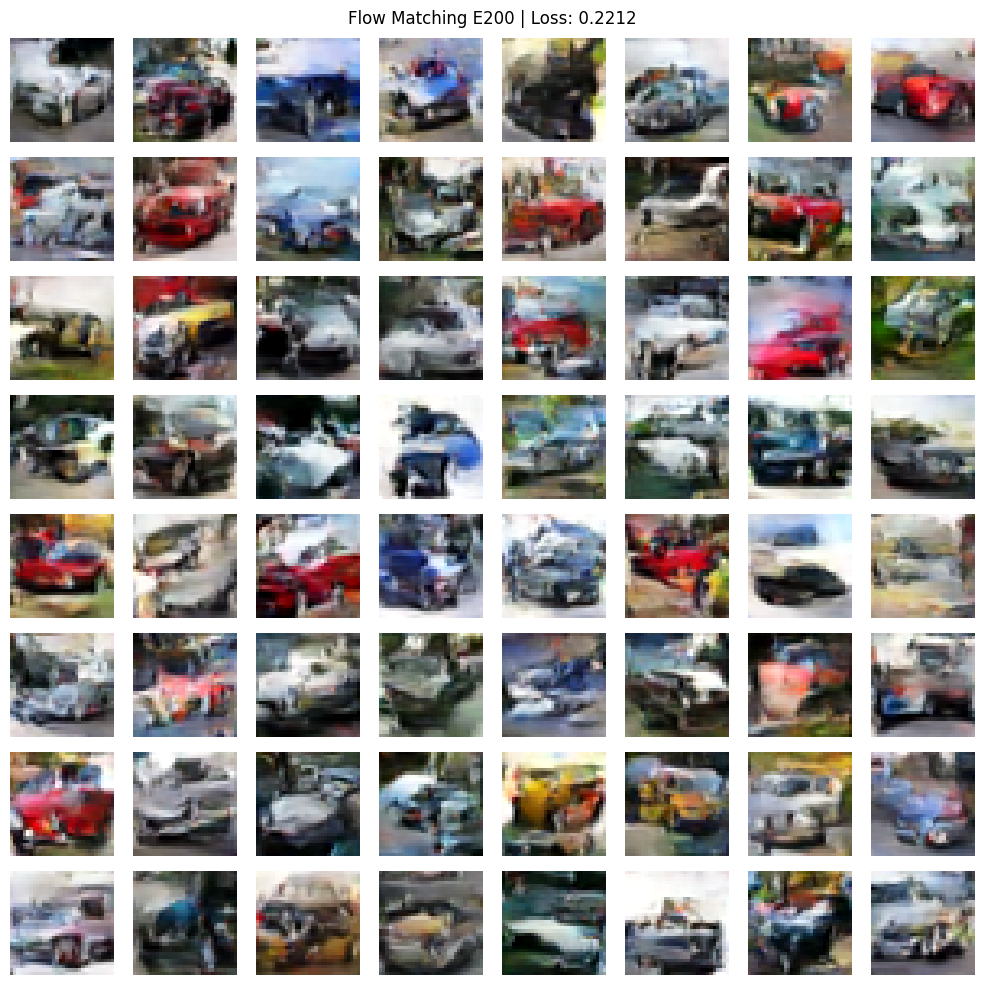

E201:   0%|          | 0/39 [00:00<?, ?it/s]

E202:   0%|          | 0/39 [00:00<?, ?it/s]

E203:   0%|          | 0/39 [00:00<?, ?it/s]

E204:   0%|          | 0/39 [00:00<?, ?it/s]

E205:   0%|          | 0/39 [00:00<?, ?it/s]

E206:   0%|          | 0/39 [00:00<?, ?it/s]

E207:   0%|          | 0/39 [00:00<?, ?it/s]

E208:   0%|          | 0/39 [00:00<?, ?it/s]

E209:   0%|          | 0/39 [00:00<?, ?it/s]

E210:   0%|          | 0/39 [00:00<?, ?it/s]

E210 | Loss: 0.2202


E211:   0%|          | 0/39 [00:00<?, ?it/s]

E212:   0%|          | 0/39 [00:00<?, ?it/s]

E213:   0%|          | 0/39 [00:00<?, ?it/s]

E214:   0%|          | 0/39 [00:00<?, ?it/s]

E215:   0%|          | 0/39 [00:00<?, ?it/s]

E216:   0%|          | 0/39 [00:00<?, ?it/s]

E217:   0%|          | 0/39 [00:00<?, ?it/s]

E218:   0%|          | 0/39 [00:00<?, ?it/s]

E219:   0%|          | 0/39 [00:00<?, ?it/s]

E220:   0%|          | 0/39 [00:00<?, ?it/s]

E220 | Loss: 0.2213


E221:   0%|          | 0/39 [00:00<?, ?it/s]

E222:   0%|          | 0/39 [00:00<?, ?it/s]

E223:   0%|          | 0/39 [00:00<?, ?it/s]

E224:   0%|          | 0/39 [00:00<?, ?it/s]

E225:   0%|          | 0/39 [00:00<?, ?it/s]

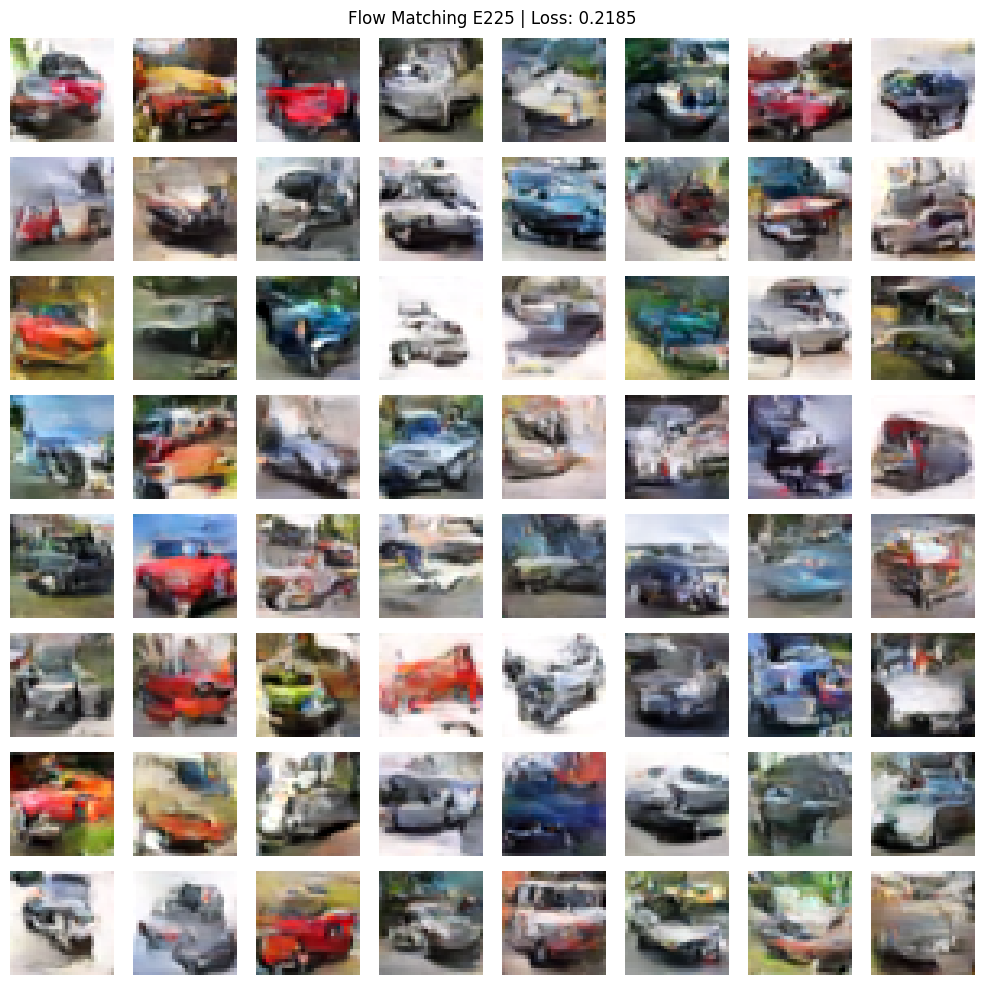

E226:   0%|          | 0/39 [00:00<?, ?it/s]

E227:   0%|          | 0/39 [00:00<?, ?it/s]

E228:   0%|          | 0/39 [00:00<?, ?it/s]

E229:   0%|          | 0/39 [00:00<?, ?it/s]

E230:   0%|          | 0/39 [00:00<?, ?it/s]

E230 | Loss: 0.2174


E231:   0%|          | 0/39 [00:00<?, ?it/s]

E232:   0%|          | 0/39 [00:00<?, ?it/s]

E233:   0%|          | 0/39 [00:00<?, ?it/s]

E234:   0%|          | 0/39 [00:00<?, ?it/s]

E235:   0%|          | 0/39 [00:00<?, ?it/s]

E236:   0%|          | 0/39 [00:00<?, ?it/s]

E237:   0%|          | 0/39 [00:00<?, ?it/s]

E238:   0%|          | 0/39 [00:00<?, ?it/s]

E239:   0%|          | 0/39 [00:00<?, ?it/s]

E240:   0%|          | 0/39 [00:00<?, ?it/s]

E240 | Loss: 0.2188


E241:   0%|          | 0/39 [00:00<?, ?it/s]

E242:   0%|          | 0/39 [00:00<?, ?it/s]

E243:   0%|          | 0/39 [00:00<?, ?it/s]

E244:   0%|          | 0/39 [00:00<?, ?it/s]

E245:   0%|          | 0/39 [00:00<?, ?it/s]

E246:   0%|          | 0/39 [00:00<?, ?it/s]

E247:   0%|          | 0/39 [00:00<?, ?it/s]

E248:   0%|          | 0/39 [00:00<?, ?it/s]

E249:   0%|          | 0/39 [00:00<?, ?it/s]

E250:   0%|          | 0/39 [00:00<?, ?it/s]

E250 | Loss: 0.2185


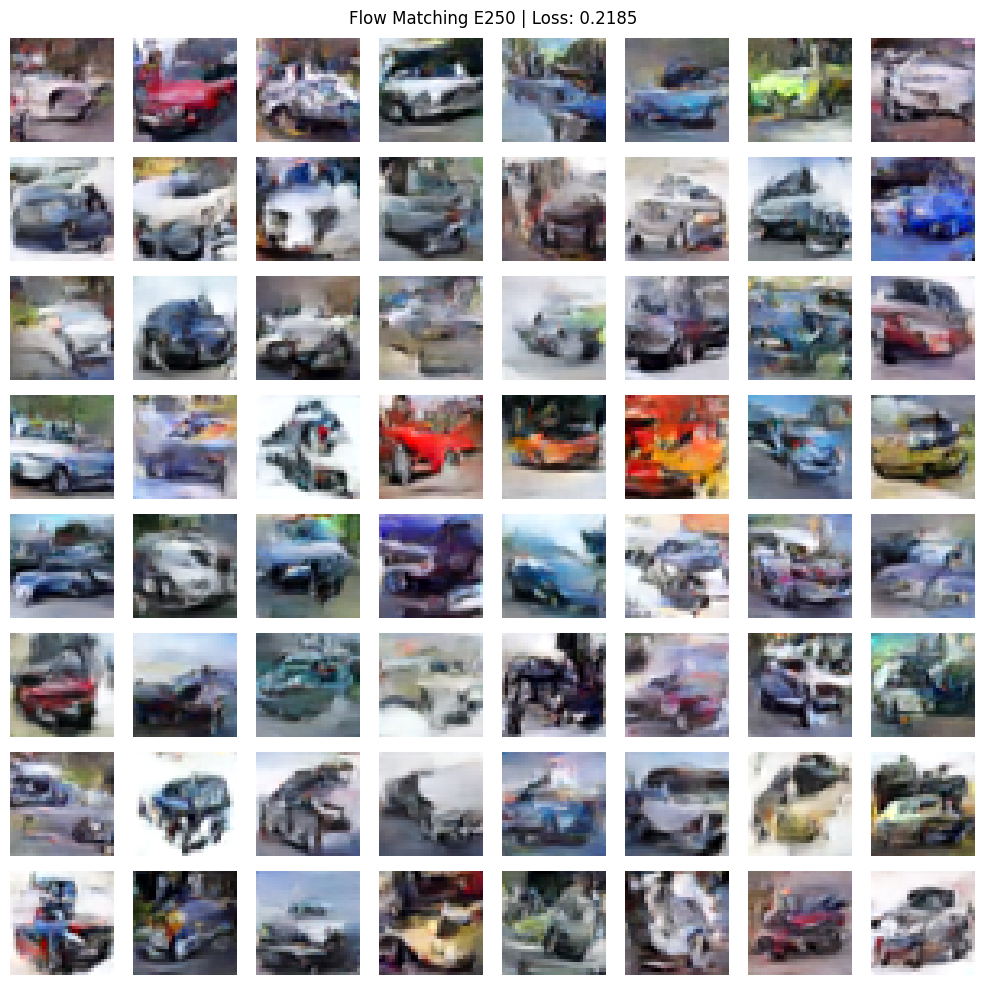

E251:   0%|          | 0/39 [00:00<?, ?it/s]

E252:   0%|          | 0/39 [00:00<?, ?it/s]

E253:   0%|          | 0/39 [00:00<?, ?it/s]

E254:   0%|          | 0/39 [00:00<?, ?it/s]

E255:   0%|          | 0/39 [00:00<?, ?it/s]

E256:   0%|          | 0/39 [00:00<?, ?it/s]

E257:   0%|          | 0/39 [00:00<?, ?it/s]

E258:   0%|          | 0/39 [00:00<?, ?it/s]

E259:   0%|          | 0/39 [00:00<?, ?it/s]

E260:   0%|          | 0/39 [00:00<?, ?it/s]

E260 | Loss: 0.2167


E261:   0%|          | 0/39 [00:00<?, ?it/s]

E262:   0%|          | 0/39 [00:00<?, ?it/s]

E263:   0%|          | 0/39 [00:00<?, ?it/s]

E264:   0%|          | 0/39 [00:00<?, ?it/s]

E265:   0%|          | 0/39 [00:00<?, ?it/s]

E266:   0%|          | 0/39 [00:00<?, ?it/s]

E267:   0%|          | 0/39 [00:00<?, ?it/s]

E268:   0%|          | 0/39 [00:00<?, ?it/s]

E269:   0%|          | 0/39 [00:00<?, ?it/s]

E270:   0%|          | 0/39 [00:00<?, ?it/s]

E270 | Loss: 0.2175


E271:   0%|          | 0/39 [00:00<?, ?it/s]

E272:   0%|          | 0/39 [00:00<?, ?it/s]

E273:   0%|          | 0/39 [00:00<?, ?it/s]

E274:   0%|          | 0/39 [00:00<?, ?it/s]

E275:   0%|          | 0/39 [00:00<?, ?it/s]

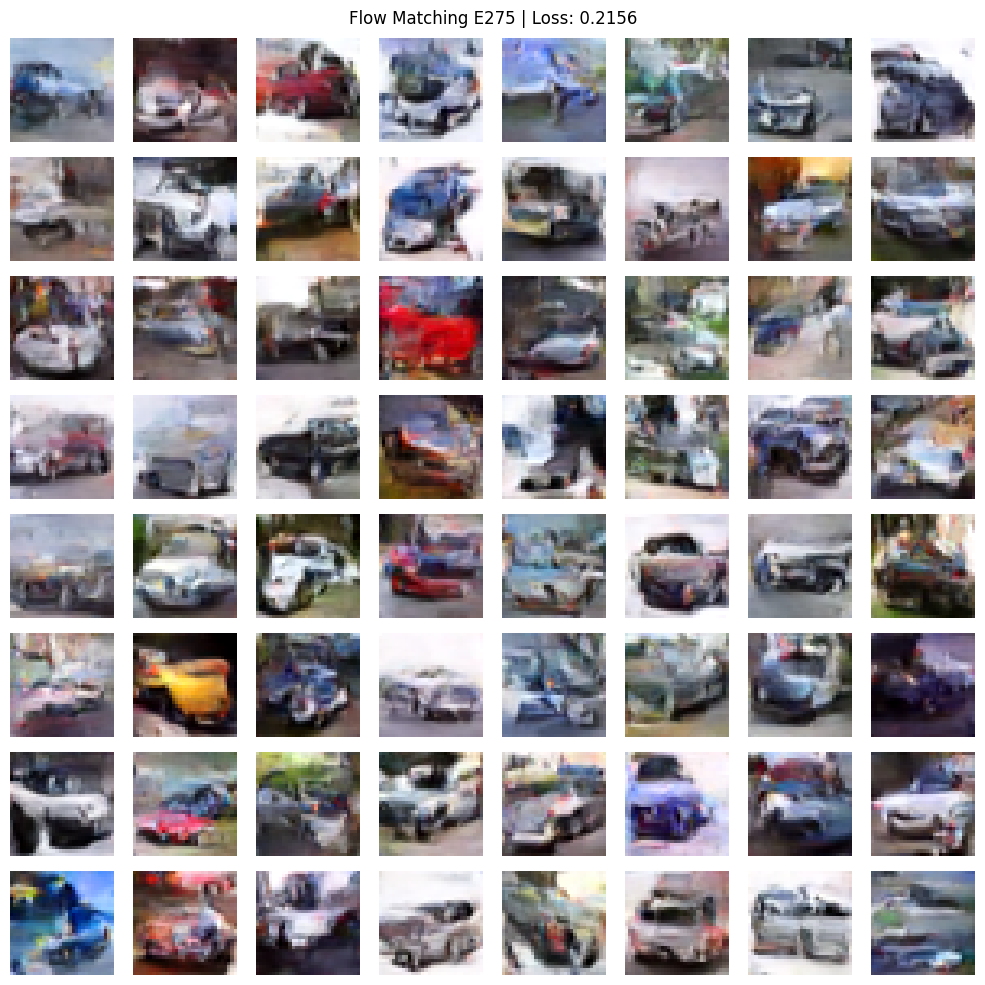

E276:   0%|          | 0/39 [00:00<?, ?it/s]

E277:   0%|          | 0/39 [00:00<?, ?it/s]

E278:   0%|          | 0/39 [00:00<?, ?it/s]

E279:   0%|          | 0/39 [00:00<?, ?it/s]

E280:   0%|          | 0/39 [00:00<?, ?it/s]

E280 | Loss: 0.2179


E281:   0%|          | 0/39 [00:00<?, ?it/s]

E282:   0%|          | 0/39 [00:00<?, ?it/s]

E283:   0%|          | 0/39 [00:00<?, ?it/s]

E284:   0%|          | 0/39 [00:00<?, ?it/s]

E285:   0%|          | 0/39 [00:00<?, ?it/s]

E286:   0%|          | 0/39 [00:00<?, ?it/s]

E287:   0%|          | 0/39 [00:00<?, ?it/s]

E288:   0%|          | 0/39 [00:00<?, ?it/s]

E289:   0%|          | 0/39 [00:00<?, ?it/s]

E290:   0%|          | 0/39 [00:00<?, ?it/s]

E290 | Loss: 0.2155


E291:   0%|          | 0/39 [00:00<?, ?it/s]

E292:   0%|          | 0/39 [00:00<?, ?it/s]

E293:   0%|          | 0/39 [00:00<?, ?it/s]

E294:   0%|          | 0/39 [00:00<?, ?it/s]

E295:   0%|          | 0/39 [00:00<?, ?it/s]

E296:   0%|          | 0/39 [00:00<?, ?it/s]

E297:   0%|          | 0/39 [00:00<?, ?it/s]

E298:   0%|          | 0/39 [00:00<?, ?it/s]

E299:   0%|          | 0/39 [00:00<?, ?it/s]

E300:   0%|          | 0/39 [00:00<?, ?it/s]

E300 | Loss: 0.2162


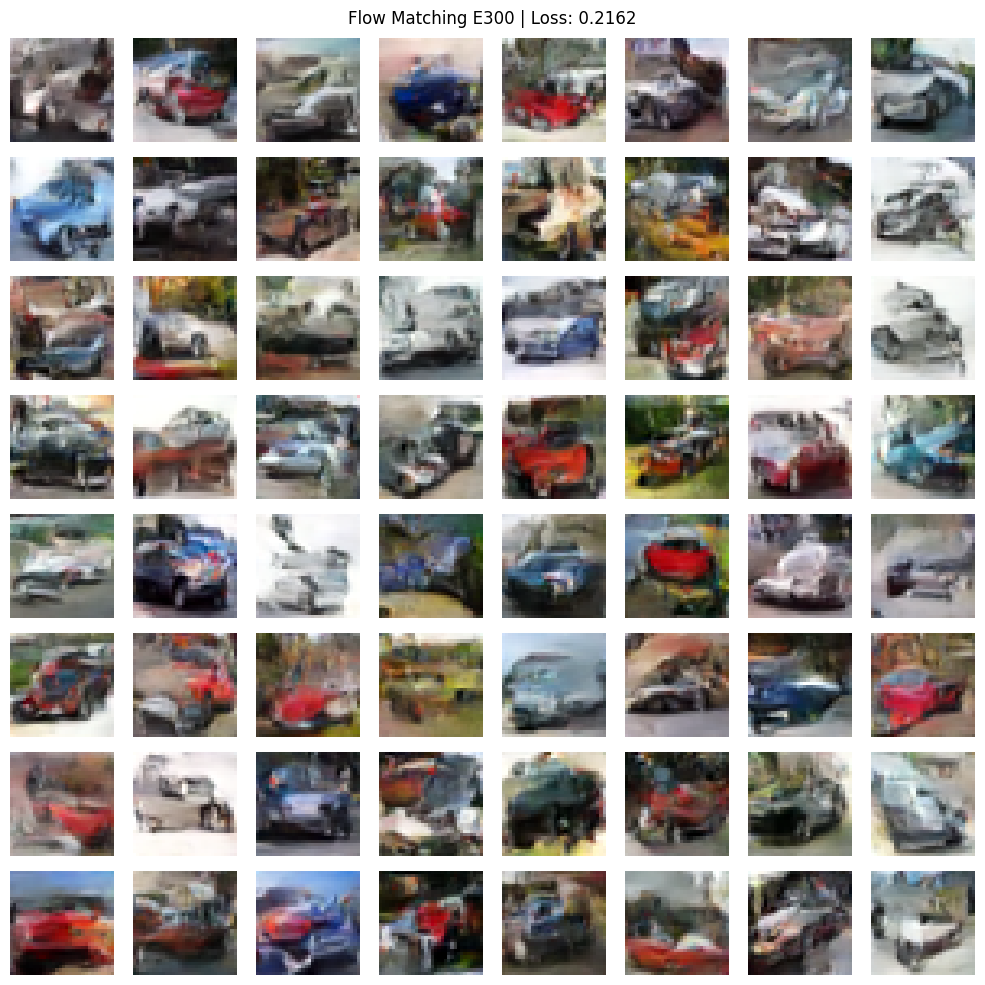

E301:   0%|          | 0/39 [00:00<?, ?it/s]

E302:   0%|          | 0/39 [00:00<?, ?it/s]

E303:   0%|          | 0/39 [00:00<?, ?it/s]

E304:   0%|          | 0/39 [00:00<?, ?it/s]

E305:   0%|          | 0/39 [00:00<?, ?it/s]

E306:   0%|          | 0/39 [00:00<?, ?it/s]

E307:   0%|          | 0/39 [00:00<?, ?it/s]

E308:   0%|          | 0/39 [00:00<?, ?it/s]

E309:   0%|          | 0/39 [00:00<?, ?it/s]

E310:   0%|          | 0/39 [00:00<?, ?it/s]

E310 | Loss: 0.2129


E311:   0%|          | 0/39 [00:00<?, ?it/s]

E312:   0%|          | 0/39 [00:00<?, ?it/s]

E313:   0%|          | 0/39 [00:00<?, ?it/s]

E314:   0%|          | 0/39 [00:00<?, ?it/s]

E315:   0%|          | 0/39 [00:00<?, ?it/s]

E316:   0%|          | 0/39 [00:00<?, ?it/s]

E317:   0%|          | 0/39 [00:00<?, ?it/s]

E318:   0%|          | 0/39 [00:00<?, ?it/s]

E319:   0%|          | 0/39 [00:00<?, ?it/s]

E320:   0%|          | 0/39 [00:00<?, ?it/s]

E320 | Loss: 0.2164


E321:   0%|          | 0/39 [00:00<?, ?it/s]

E322:   0%|          | 0/39 [00:00<?, ?it/s]

E323:   0%|          | 0/39 [00:00<?, ?it/s]

E324:   0%|          | 0/39 [00:00<?, ?it/s]

E325:   0%|          | 0/39 [00:00<?, ?it/s]

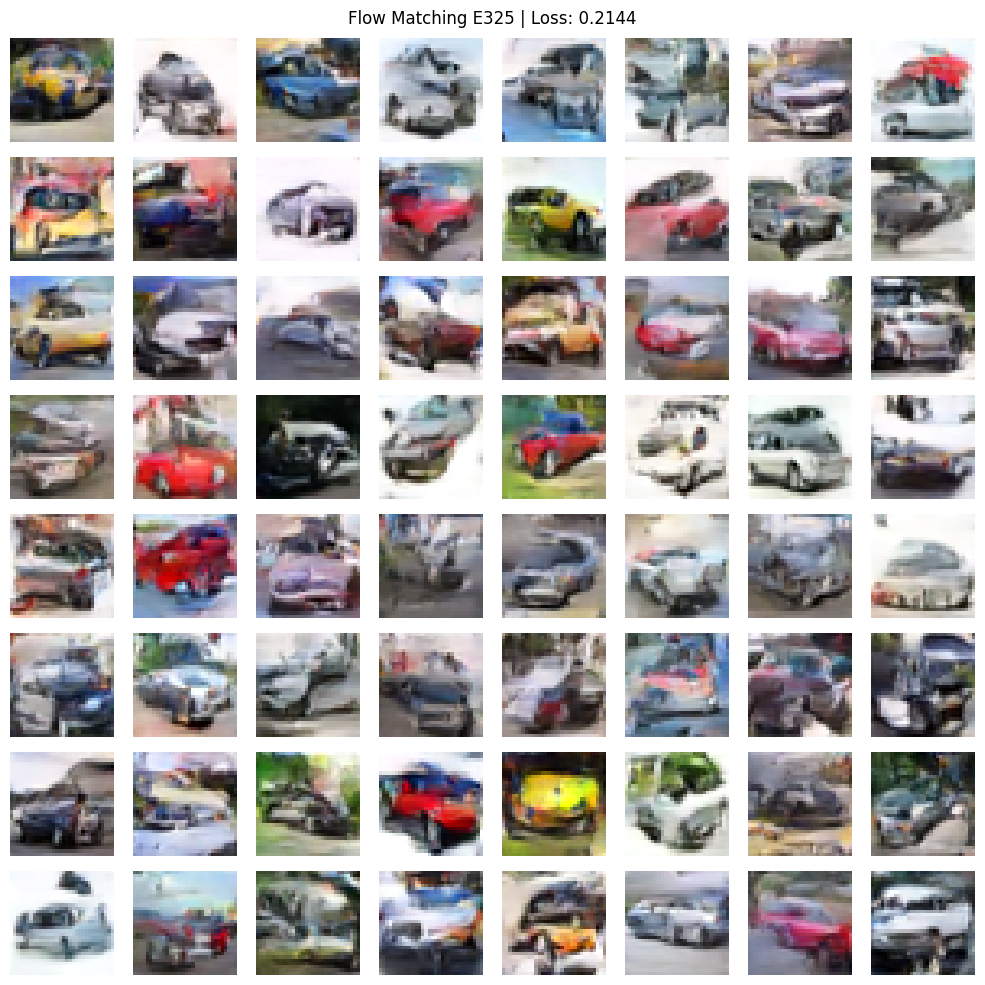

E326:   0%|          | 0/39 [00:00<?, ?it/s]

E327:   0%|          | 0/39 [00:00<?, ?it/s]

E328:   0%|          | 0/39 [00:00<?, ?it/s]

E329:   0%|          | 0/39 [00:00<?, ?it/s]

E330:   0%|          | 0/39 [00:00<?, ?it/s]

E330 | Loss: 0.2134


E331:   0%|          | 0/39 [00:00<?, ?it/s]

E332:   0%|          | 0/39 [00:00<?, ?it/s]

E333:   0%|          | 0/39 [00:00<?, ?it/s]

E334:   0%|          | 0/39 [00:00<?, ?it/s]

E335:   0%|          | 0/39 [00:00<?, ?it/s]

E336:   0%|          | 0/39 [00:00<?, ?it/s]

E337:   0%|          | 0/39 [00:00<?, ?it/s]

E338:   0%|          | 0/39 [00:00<?, ?it/s]

E339:   0%|          | 0/39 [00:00<?, ?it/s]

E340:   0%|          | 0/39 [00:00<?, ?it/s]

E340 | Loss: 0.2160


E341:   0%|          | 0/39 [00:00<?, ?it/s]

E342:   0%|          | 0/39 [00:00<?, ?it/s]

E343:   0%|          | 0/39 [00:00<?, ?it/s]

E344:   0%|          | 0/39 [00:00<?, ?it/s]

E345:   0%|          | 0/39 [00:00<?, ?it/s]

E346:   0%|          | 0/39 [00:00<?, ?it/s]

E347:   0%|          | 0/39 [00:00<?, ?it/s]

E348:   0%|          | 0/39 [00:00<?, ?it/s]

E349:   0%|          | 0/39 [00:00<?, ?it/s]

E350:   0%|          | 0/39 [00:00<?, ?it/s]

E350 | Loss: 0.2171


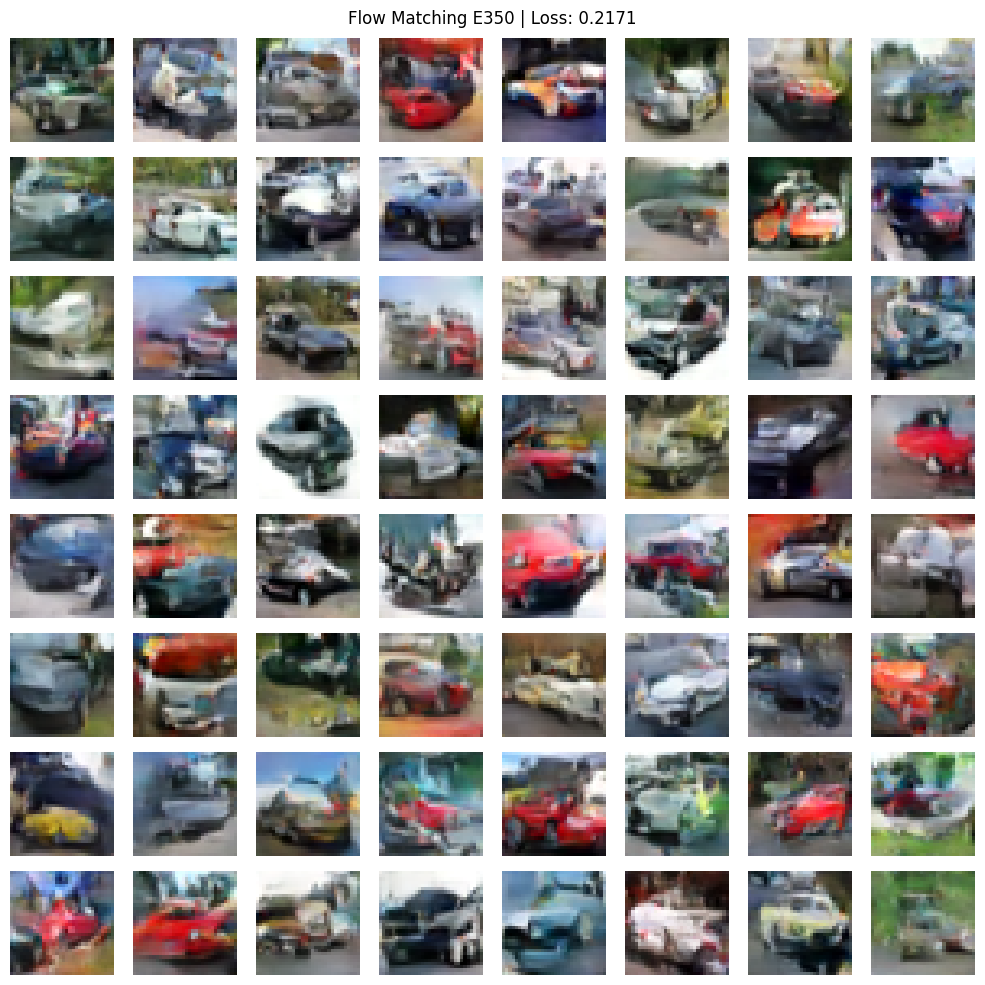

E351:   0%|          | 0/39 [00:00<?, ?it/s]

E352:   0%|          | 0/39 [00:00<?, ?it/s]

E353:   0%|          | 0/39 [00:00<?, ?it/s]

E354:   0%|          | 0/39 [00:00<?, ?it/s]

E355:   0%|          | 0/39 [00:00<?, ?it/s]

E356:   0%|          | 0/39 [00:00<?, ?it/s]

E357:   0%|          | 0/39 [00:00<?, ?it/s]

E358:   0%|          | 0/39 [00:00<?, ?it/s]

E359:   0%|          | 0/39 [00:00<?, ?it/s]

E360:   0%|          | 0/39 [00:00<?, ?it/s]

E360 | Loss: 0.2136


E361:   0%|          | 0/39 [00:00<?, ?it/s]

E362:   0%|          | 0/39 [00:00<?, ?it/s]

E363:   0%|          | 0/39 [00:00<?, ?it/s]

E364:   0%|          | 0/39 [00:00<?, ?it/s]

E365:   0%|          | 0/39 [00:00<?, ?it/s]

E366:   0%|          | 0/39 [00:00<?, ?it/s]

E367:   0%|          | 0/39 [00:00<?, ?it/s]

E368:   0%|          | 0/39 [00:00<?, ?it/s]

E369:   0%|          | 0/39 [00:00<?, ?it/s]

E370:   0%|          | 0/39 [00:00<?, ?it/s]

E370 | Loss: 0.2155


E371:   0%|          | 0/39 [00:00<?, ?it/s]

E372:   0%|          | 0/39 [00:00<?, ?it/s]

E373:   0%|          | 0/39 [00:00<?, ?it/s]

E374:   0%|          | 0/39 [00:00<?, ?it/s]

E375:   0%|          | 0/39 [00:00<?, ?it/s]

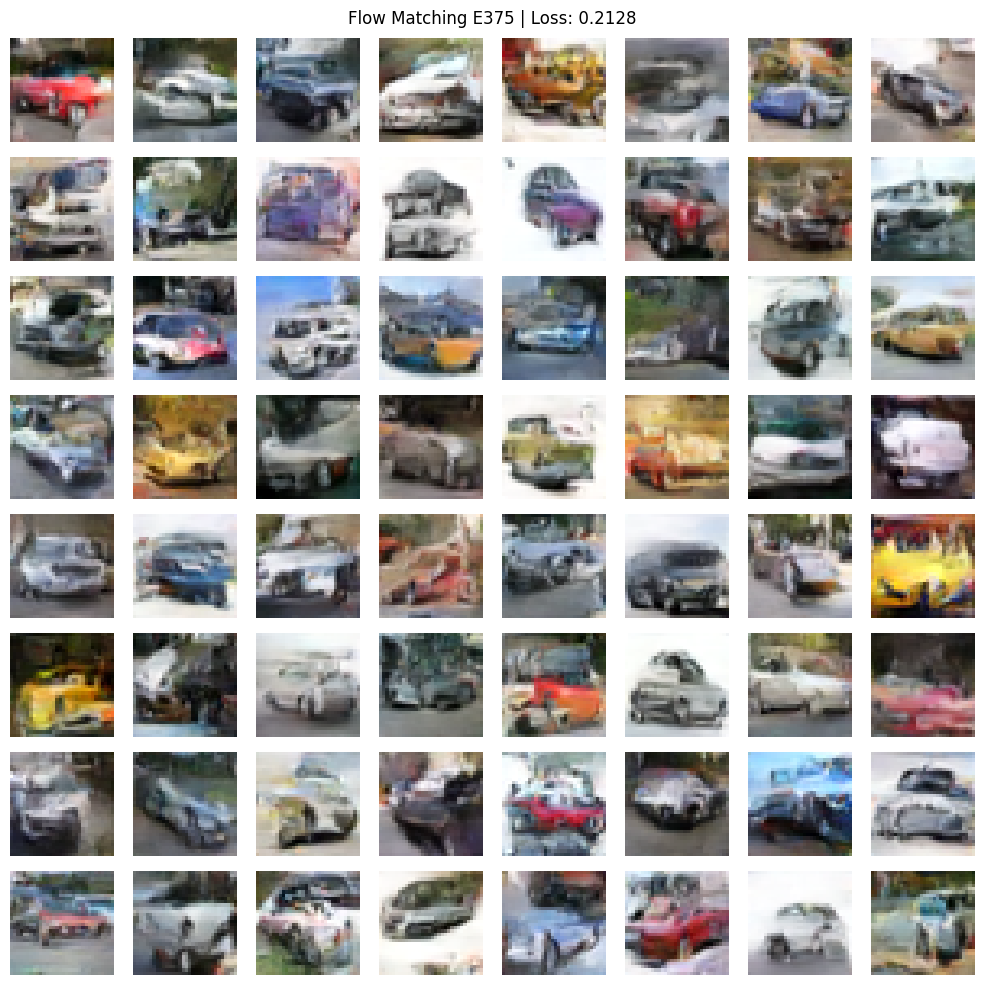

E376:   0%|          | 0/39 [00:00<?, ?it/s]

E377:   0%|          | 0/39 [00:00<?, ?it/s]

E378:   0%|          | 0/39 [00:00<?, ?it/s]

E379:   0%|          | 0/39 [00:00<?, ?it/s]

E380:   0%|          | 0/39 [00:00<?, ?it/s]

E380 | Loss: 0.2139


E381:   0%|          | 0/39 [00:00<?, ?it/s]

E382:   0%|          | 0/39 [00:00<?, ?it/s]

E383:   0%|          | 0/39 [00:00<?, ?it/s]

E384:   0%|          | 0/39 [00:00<?, ?it/s]

E385:   0%|          | 0/39 [00:00<?, ?it/s]

E386:   0%|          | 0/39 [00:00<?, ?it/s]

E387:   0%|          | 0/39 [00:00<?, ?it/s]

E388:   0%|          | 0/39 [00:00<?, ?it/s]

E389:   0%|          | 0/39 [00:00<?, ?it/s]

E390:   0%|          | 0/39 [00:00<?, ?it/s]

E390 | Loss: 0.2125


E391:   0%|          | 0/39 [00:00<?, ?it/s]

E392:   0%|          | 0/39 [00:00<?, ?it/s]

E393:   0%|          | 0/39 [00:00<?, ?it/s]

E394:   0%|          | 0/39 [00:00<?, ?it/s]

E395:   0%|          | 0/39 [00:00<?, ?it/s]

E396:   0%|          | 0/39 [00:00<?, ?it/s]

E397:   0%|          | 0/39 [00:00<?, ?it/s]

E398:   0%|          | 0/39 [00:00<?, ?it/s]

E399:   0%|          | 0/39 [00:00<?, ?it/s]

E400:   0%|          | 0/39 [00:00<?, ?it/s]

E400 | Loss: 0.2129


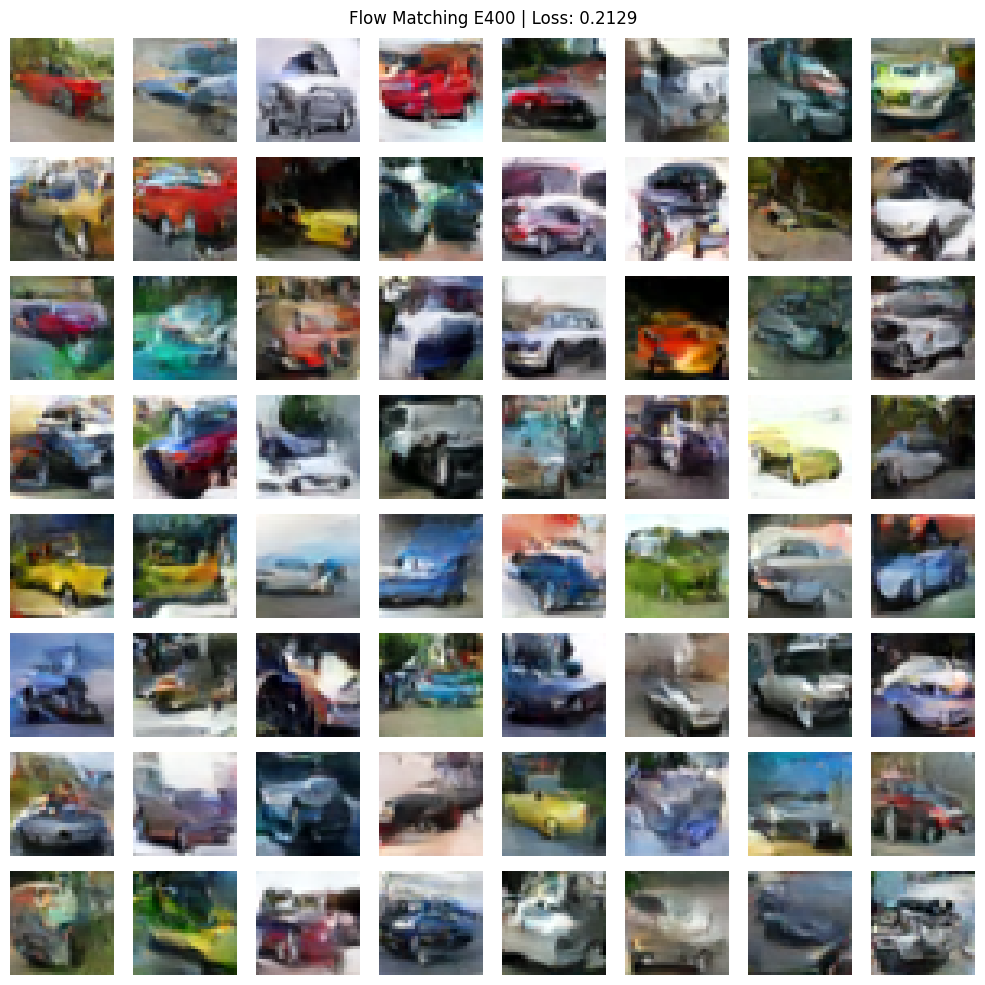

E401:   0%|          | 0/39 [00:00<?, ?it/s]

E402:   0%|          | 0/39 [00:00<?, ?it/s]

E403:   0%|          | 0/39 [00:00<?, ?it/s]

E404:   0%|          | 0/39 [00:00<?, ?it/s]

E405:   0%|          | 0/39 [00:00<?, ?it/s]

E406:   0%|          | 0/39 [00:00<?, ?it/s]

E407:   0%|          | 0/39 [00:00<?, ?it/s]

E408:   0%|          | 0/39 [00:00<?, ?it/s]

E409:   0%|          | 0/39 [00:00<?, ?it/s]

E410:   0%|          | 0/39 [00:00<?, ?it/s]

E410 | Loss: 0.2098


E411:   0%|          | 0/39 [00:00<?, ?it/s]

E412:   0%|          | 0/39 [00:00<?, ?it/s]

E413:   0%|          | 0/39 [00:00<?, ?it/s]

E414:   0%|          | 0/39 [00:00<?, ?it/s]

E415:   0%|          | 0/39 [00:00<?, ?it/s]

E416:   0%|          | 0/39 [00:00<?, ?it/s]

E417:   0%|          | 0/39 [00:00<?, ?it/s]

E418:   0%|          | 0/39 [00:00<?, ?it/s]

E419:   0%|          | 0/39 [00:00<?, ?it/s]

E420:   0%|          | 0/39 [00:00<?, ?it/s]

E420 | Loss: 0.2122


E421:   0%|          | 0/39 [00:00<?, ?it/s]

E422:   0%|          | 0/39 [00:00<?, ?it/s]

E423:   0%|          | 0/39 [00:00<?, ?it/s]

E424:   0%|          | 0/39 [00:00<?, ?it/s]

E425:   0%|          | 0/39 [00:00<?, ?it/s]

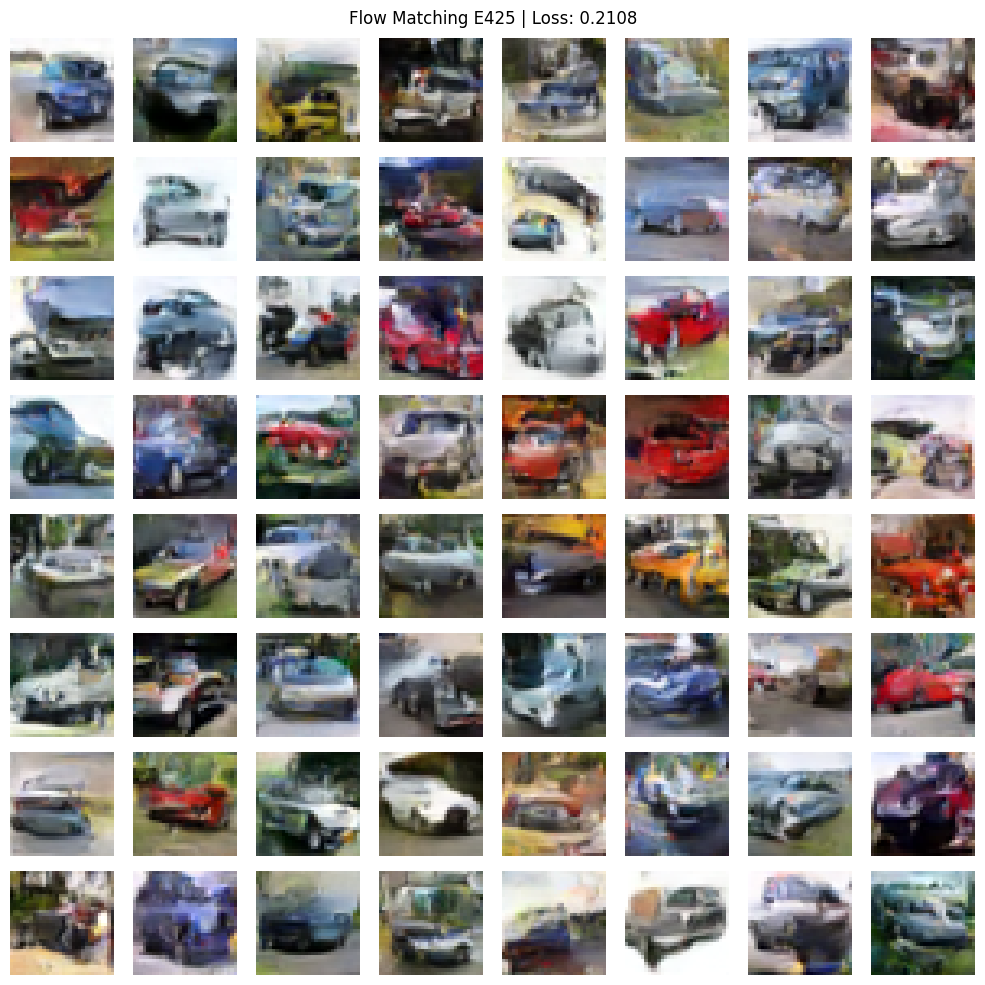

E426:   0%|          | 0/39 [00:00<?, ?it/s]

E427:   0%|          | 0/39 [00:00<?, ?it/s]

E428:   0%|          | 0/39 [00:00<?, ?it/s]

E429:   0%|          | 0/39 [00:00<?, ?it/s]

E430:   0%|          | 0/39 [00:00<?, ?it/s]

E430 | Loss: 0.2132


E431:   0%|          | 0/39 [00:00<?, ?it/s]

E432:   0%|          | 0/39 [00:00<?, ?it/s]

E433:   0%|          | 0/39 [00:00<?, ?it/s]

E434:   0%|          | 0/39 [00:00<?, ?it/s]

E435:   0%|          | 0/39 [00:00<?, ?it/s]

E436:   0%|          | 0/39 [00:00<?, ?it/s]

E437:   0%|          | 0/39 [00:00<?, ?it/s]

E438:   0%|          | 0/39 [00:00<?, ?it/s]

E439:   0%|          | 0/39 [00:00<?, ?it/s]

E440:   0%|          | 0/39 [00:00<?, ?it/s]

E440 | Loss: 0.2117


E441:   0%|          | 0/39 [00:00<?, ?it/s]

E442:   0%|          | 0/39 [00:00<?, ?it/s]

E443:   0%|          | 0/39 [00:00<?, ?it/s]

E444:   0%|          | 0/39 [00:00<?, ?it/s]

E445:   0%|          | 0/39 [00:00<?, ?it/s]

E446:   0%|          | 0/39 [00:00<?, ?it/s]

E447:   0%|          | 0/39 [00:00<?, ?it/s]

E448:   0%|          | 0/39 [00:00<?, ?it/s]

E449:   0%|          | 0/39 [00:00<?, ?it/s]

E450:   0%|          | 0/39 [00:00<?, ?it/s]

E450 | Loss: 0.2121


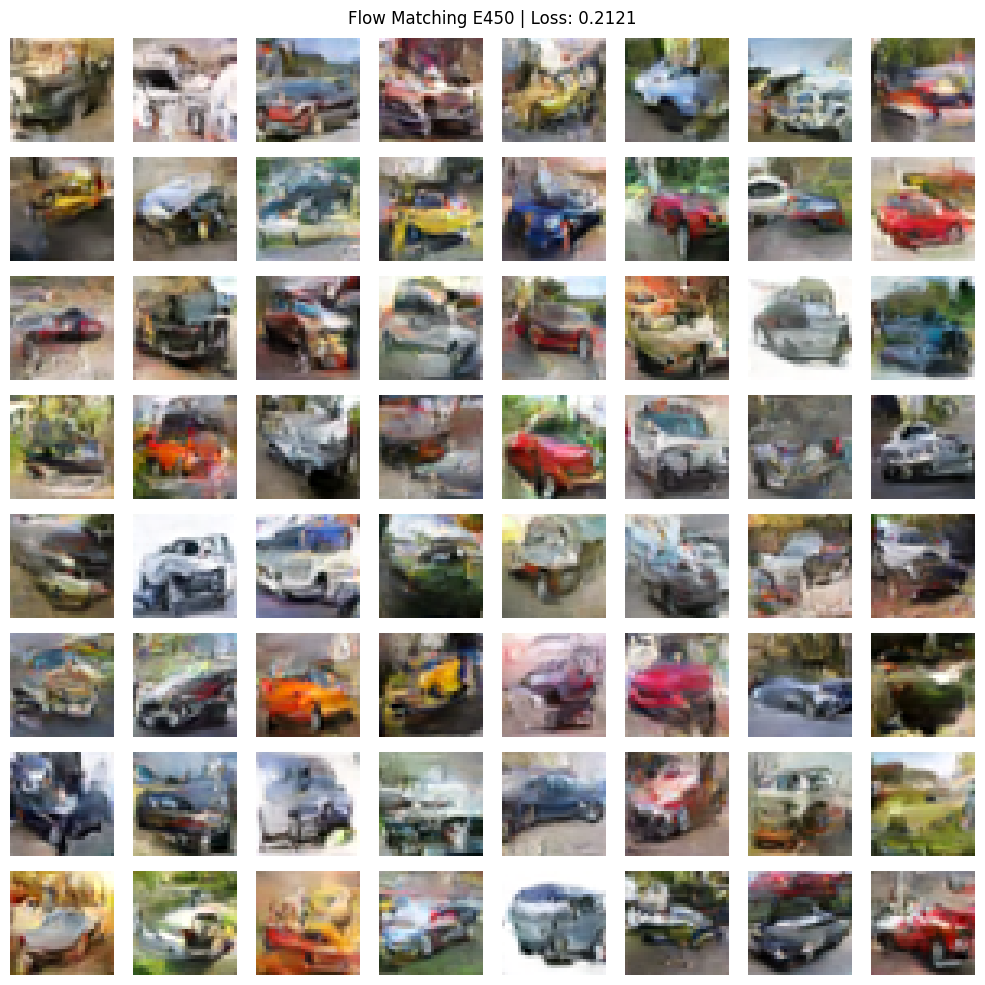

E451:   0%|          | 0/39 [00:00<?, ?it/s]

E452:   0%|          | 0/39 [00:00<?, ?it/s]

E453:   0%|          | 0/39 [00:00<?, ?it/s]

E454:   0%|          | 0/39 [00:00<?, ?it/s]

E455:   0%|          | 0/39 [00:00<?, ?it/s]

E456:   0%|          | 0/39 [00:00<?, ?it/s]

E457:   0%|          | 0/39 [00:00<?, ?it/s]

E458:   0%|          | 0/39 [00:00<?, ?it/s]

E459:   0%|          | 0/39 [00:00<?, ?it/s]

E460:   0%|          | 0/39 [00:00<?, ?it/s]

E460 | Loss: 0.2105


E461:   0%|          | 0/39 [00:00<?, ?it/s]

E462:   0%|          | 0/39 [00:00<?, ?it/s]

E463:   0%|          | 0/39 [00:00<?, ?it/s]

E464:   0%|          | 0/39 [00:00<?, ?it/s]

E465:   0%|          | 0/39 [00:00<?, ?it/s]

E466:   0%|          | 0/39 [00:00<?, ?it/s]

E467:   0%|          | 0/39 [00:00<?, ?it/s]

E468:   0%|          | 0/39 [00:00<?, ?it/s]

E469:   0%|          | 0/39 [00:00<?, ?it/s]

E470:   0%|          | 0/39 [00:00<?, ?it/s]

E470 | Loss: 0.2096


E471:   0%|          | 0/39 [00:00<?, ?it/s]

E472:   0%|          | 0/39 [00:00<?, ?it/s]

E473:   0%|          | 0/39 [00:00<?, ?it/s]

E474:   0%|          | 0/39 [00:00<?, ?it/s]

E475:   0%|          | 0/39 [00:00<?, ?it/s]

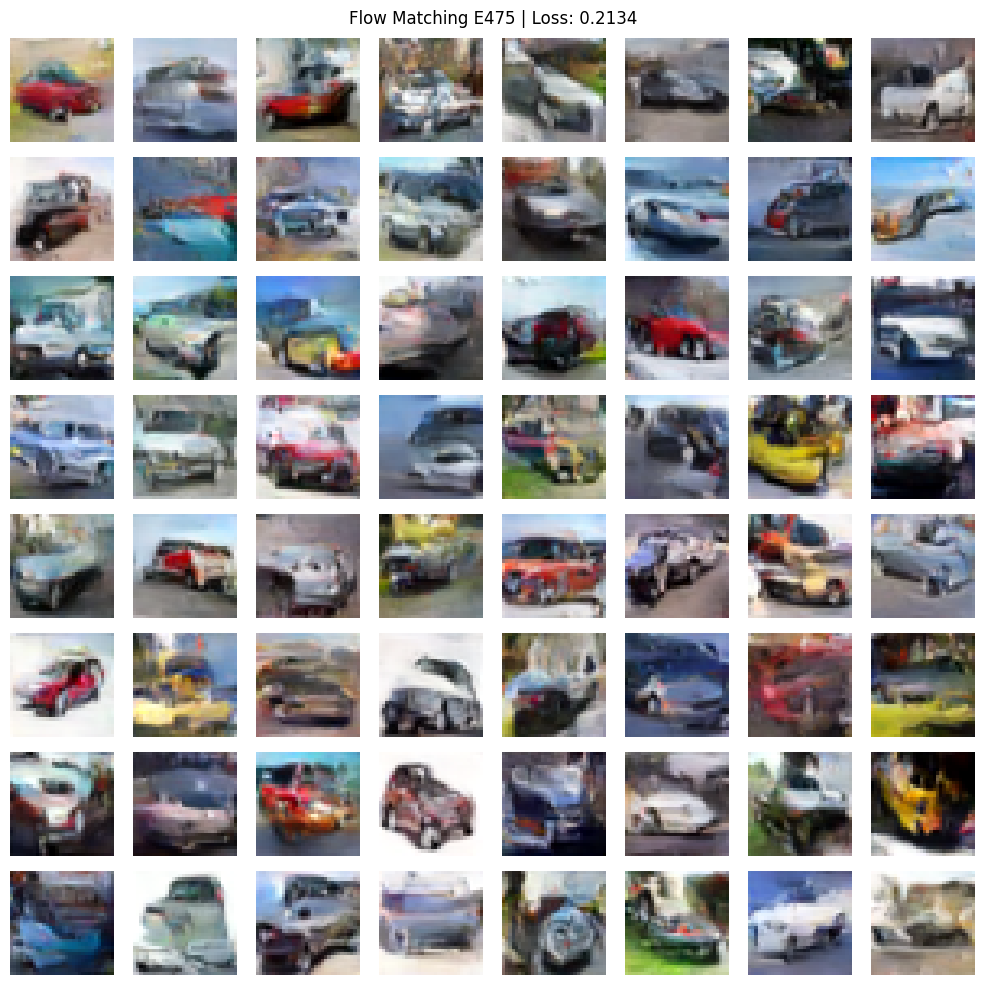

E476:   0%|          | 0/39 [00:00<?, ?it/s]

E477:   0%|          | 0/39 [00:00<?, ?it/s]

E478:   0%|          | 0/39 [00:00<?, ?it/s]

E479:   0%|          | 0/39 [00:00<?, ?it/s]

E480:   0%|          | 0/39 [00:00<?, ?it/s]

E480 | Loss: 0.2123


E481:   0%|          | 0/39 [00:00<?, ?it/s]

E482:   0%|          | 0/39 [00:00<?, ?it/s]

E483:   0%|          | 0/39 [00:00<?, ?it/s]

E484:   0%|          | 0/39 [00:00<?, ?it/s]

E485:   0%|          | 0/39 [00:00<?, ?it/s]

E486:   0%|          | 0/39 [00:00<?, ?it/s]

E487:   0%|          | 0/39 [00:00<?, ?it/s]

E488:   0%|          | 0/39 [00:00<?, ?it/s]

E489:   0%|          | 0/39 [00:00<?, ?it/s]

E490:   0%|          | 0/39 [00:00<?, ?it/s]

E490 | Loss: 0.2097


E491:   0%|          | 0/39 [00:00<?, ?it/s]

E492:   0%|          | 0/39 [00:00<?, ?it/s]

E493:   0%|          | 0/39 [00:00<?, ?it/s]

E494:   0%|          | 0/39 [00:00<?, ?it/s]

E495:   0%|          | 0/39 [00:00<?, ?it/s]

E496:   0%|          | 0/39 [00:00<?, ?it/s]

E497:   0%|          | 0/39 [00:00<?, ?it/s]

E498:   0%|          | 0/39 [00:00<?, ?it/s]

E499:   0%|          | 0/39 [00:00<?, ?it/s]

E500:   0%|          | 0/39 [00:00<?, ?it/s]

E500 | Loss: 0.2100


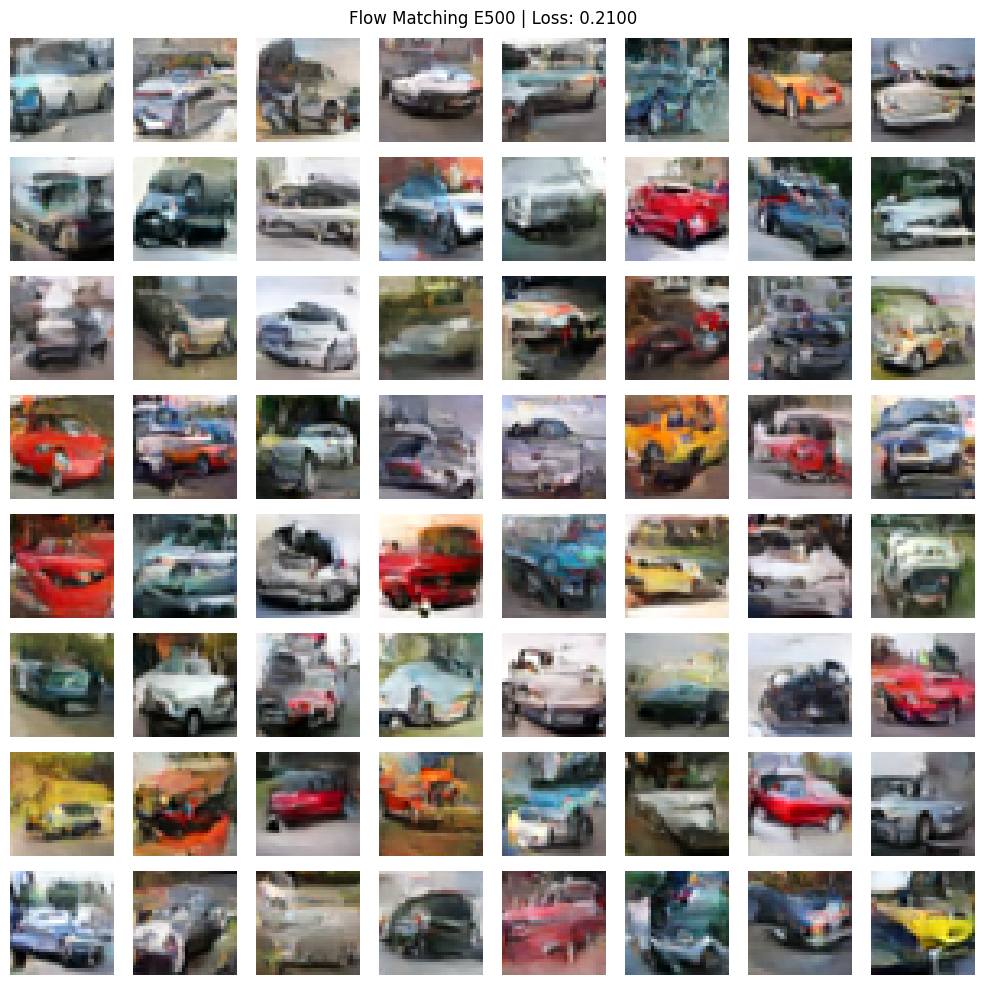


✓ Done! Final loss: 0.2100

If loss dropped to ~0.1-0.5 and samples show shapes,
then model/data are OK, and MeanFlow needs more tuning.


In [ ]:
dl = get_dl(128)

for epoch in range(epochs):
    model.train()
    el = 0

    for x, _ in tqdm(dl, desc=f"E{epoch+1}", leave=False):
        loss = flow_matching_loss(model, x.to(device), device)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        el += loss.item()

    avg = el / len(dl)
    loss_history.append(avg)

    if (epoch + 1) % 10 == 0 or epoch == 0:
        print(f"E{epoch+1:3d} | Loss: {avg:.4f}")

    if (epoch + 1) % 25 == 0:
        model.eval()
        samples = sample_euler(model, 64, device, steps=50)

        fig, ax = plt.subplots(8, 8, figsize=(10, 10))
        fig.suptitle(f"Flow Matching E{epoch+1} | Loss: {avg:.4f}")
        for i, a in enumerate(ax.flat):
            a.imshow(np.clip(samples[i].cpu().permute(1,2,0).numpy(), 0, 1))
            a.axis("off")
        plt.tight_layout()
        plt.savefig(f"results/fm_e{epoch+1}.png", dpi=150)
        plt.show()

print(f"\n✓ Done! Final loss: {loss_history[-1]:.4f}")
print(f"\nIf loss dropped to ~0.1-0.5 and samples show shapes,")
print("then model/data are OK, and MeanFlow needs more tuning.")

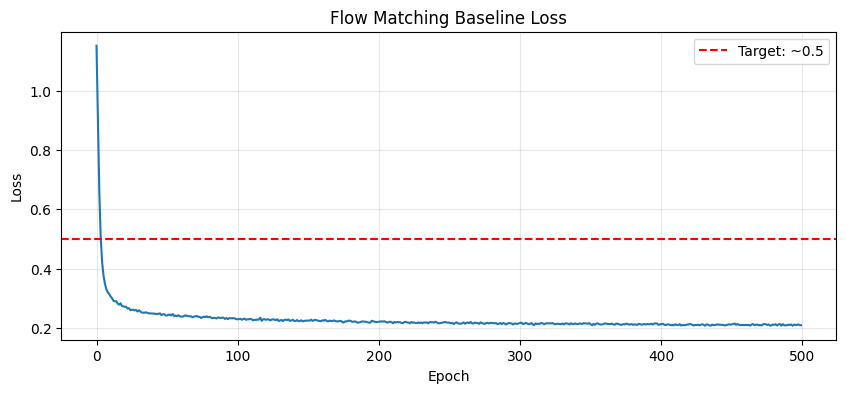

Start: 1.1508
End: 0.2100


In [ ]:
# Plot loss
plt.figure(figsize=(10, 4))
plt.plot(loss_history)
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.title('Flow Matching Baseline Loss')
plt.grid(alpha=0.3)
plt.axhline(y=0.5, color='r', linestyle='--', label='Target: ~0.5')
plt.legend()
plt.show()

print(f"Start: {loss_history[0]:.4f}")
print(f"End: {loss_history[-1]:.4f}")

## 📊 Analysis

**If Flow Matching works** (loss ~0.5, blurry shapes visible):
→ Model and data are OK. MeanFlow implementation needs debugging.

**If Flow Matching fails** (loss stays high, noise):
→ Model too small or data issue.